## 3D Scatterplot of betting odds

How unusual was it for a team paying $20 to win? Most likely, very unusual, as this 3D odds scatterplotter reveals.

One axis shows the odds for a home win, another for the draw, and the last for an away win.

In this example, I've used almost 15 years worth of data for the highest state league in Victoria, Australia. 

The pattern it creates is beautiful, and it also highlights anomolies - the red dots around the $20 mark are when the Southern Stars - who were fixing games all season in 2013 - decided to play to win against the top team. 

The highlight this anomoly further, a 3D plot of average odds per game follows.

In [129]:
import glob
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
import re

import customChartDefaultStyling
import oddsportal_compileDF

pd.set_option('display.max_columns', None)

colors = {'home': {'r': 0,'g': 100, 'b': 0}, 'draw': {'r': 249,'g': 180, 'b': 45}, 'away': {'r': 255,'g': 0, 'b': 0},}
def getColor(wintype, alpha):    
    return f'rgba({colors[wintype]["r"]}, {colors[wintype]["g"]}, {colors[wintype]["b"]}, {alpha})'

dBOOKIES = dict((row['bookie_code'], row['bookie_name']) for index, row in pd.read_csv('CSVs/dfBOOKIES.csv').iterrows())
dBOOKIES[0] = 'unknown'

In [130]:
dfAUS = oddsportal_compileDF.getDFCONCAT('australia', None)
dfAUS.head(2)

a-league              (69554, 37)	(69554, 37)
australia-cup         (7771, 37)	(77325, 37)
brisbane-premier-lea  (23123, 37)	(100448, 37)
npl-act               (14352, 37)	(114800, 37)
npl-northern-nsw      (22121, 37)	(136921, 37)
npl-nsw               (39416, 37)	(176337, 37)
npl-queensland        (43658, 37)	(219995, 37)
npl-south-australian  (42471, 37)	(262466, 37)
npl-tasmania          (18006, 37)	(280472, 37)
npl-victoria          (53414, 37)	(333886, 37)
npl-western-australi  (43417, 37)	(377303, 37)


,country,competition,season,match_id,home,away,tournamentId,day_epoch,kickoff_epoch,result,H,A,winner,bookie_code,home_win,draw,away_win,home_win_opening,draw_opening,away_win_opening,xhash,xhash_unhash,xhashf,ukeyBase,isLive,isPostponed,isStarted,isFinished,isFinishedGracePeriod,sportId,versionId,startTime_normalised,file,winning_odds,color,bookie_name,hover_text
0,australia,a-league,2005_2006,zDz2HB85,Sydney FC,Melbourne Victory,5625.0,1.125180e+09,1.125180e+09,1:1,1.0,1.0,draw,49,1.85,3.40,3.6,NaN,NaN,NaN,%79%6a%39%63%33,yj9c3,%79%6a%62%33%64,E-987655,False,False,True,True,True,1.0,1.0,0.0,CSVs/australia/a-league\dfODDS2005_2006.csv,3.40,"rgba(249, 180, 45, 0.33)",Tipsport.cz,<b>Sydney FC 1 : 1 Melbourne Victory</b><br>dr...
1,australia,a-league,2005_2006,zDz2HB85,Sydney FC,Melbourne Victory,5625.0,1.125180e+09,1.125180e+09,1:1,1.0,1.0,draw,16,1.57,3.75,4.5,NaN,NaN,NaN,%79%6a%39%63%33,yj9c3,%79%6a%62%33%64,E-987655,False,False,True,True,True,1.0,1.0,0.0,CSVs/australia/a-league\dfODDS2005_2006.csv,3.75,"rgba(249, 180, 45, 0.33)",bet365,<b>Sydney FC 1 : 1 Melbourne Victory</b><br>dr...


53414


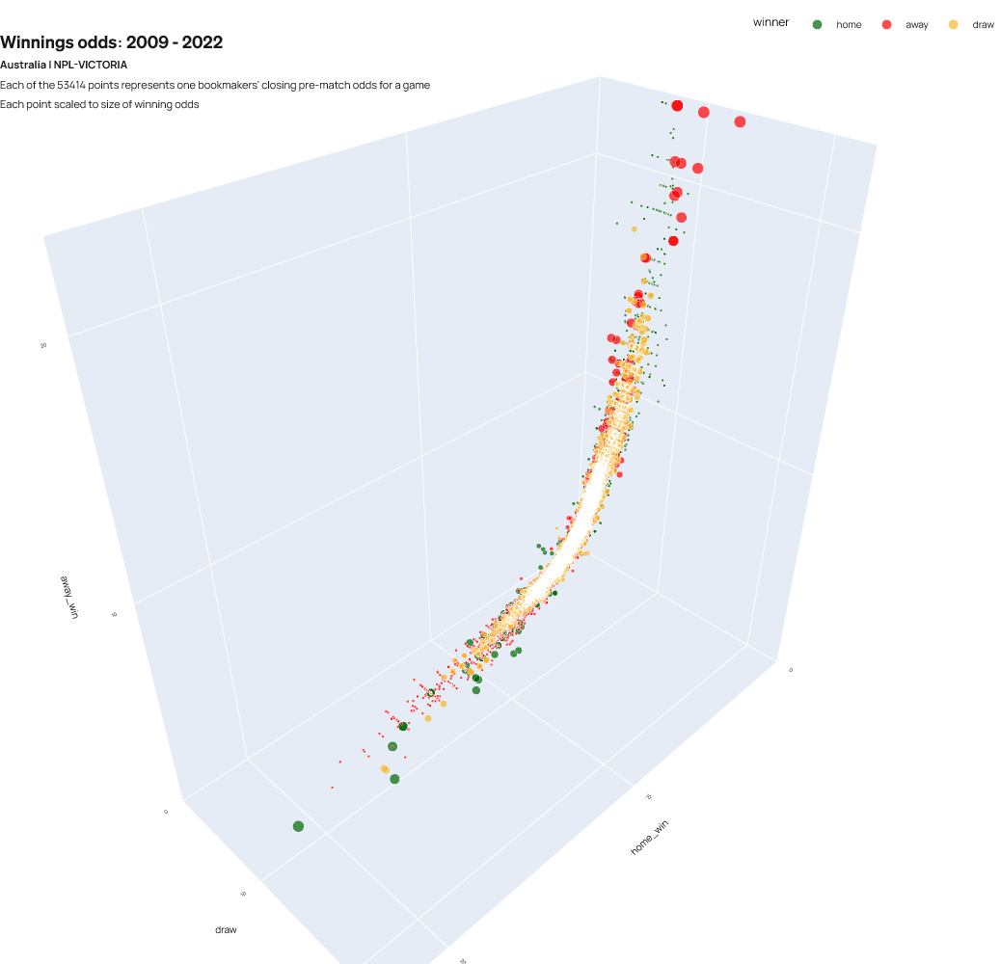

In [131]:
def make3DPlot(df, subheadChoice):
    
    print(df.shape[0])
    
    M = df['winning_odds'].max()
    
    fig = px.scatter_3d(df, x='home_win', y='draw', z='away_win',
                        color='winner', size='winning_odds',
                        color_discrete_map={"home": f'rgb({colors["home"]["r"]},{colors["home"]["g"]},{colors["home"]["b"]})', \
                                           "draw": f'rgb({colors["draw"]["r"]},{colors["draw"]["g"]},{colors["draw"]["b"]})', \
                                            "away": f'rgb({colors["away"]["r"]},{colors["away"]["g"]},{colors["away"]["b"]})'
                                           },
                        opacity=0.7,
                        hover_name=df['hover_text'], 
                        #hover_data={'Result': False, 'Winning odds': False, 'Date': False, 'Matchday': False, 'Odds home win': False, 'Odds draw':False, 'Odds away win': False, }
    )

       
    subheadA = f'Each of the {df.shape[0]} points represents one bookmakers\' closing pre-match odds for a game <br>Each point scaled to size of winning odds' 
    subheadB = f'Each of the {df.shape[0]} points represents bookmakers\' average closing pre-match odds for a game <br>Each point scaled to size of winning odds'
        
    subheadChoice = subheadA if subheadChoice == 'subheadA' else subheadB
        
    seasons = df['season'].unique()
    title_seasons = f'{seasons[-1]} - {seasons[0]}'
    
    headline, subhead, xaxes_title, yaxes_title, figHeight, marginTop, showLegend = f'Winnings odds: {title_seasons}', f'<b>{";".join([x.title() for x in df["country"].unique()])} | {"; ".join([x.upper() for x in df["competition"].unique()])}</b><br>{subheadChoice}', 'home_win_odds', 'away_win_odds', 1000, 40, True
    customChartDefaultStyling.styling(fig, headline, subhead, xaxes_title, yaxes_title, figHeight, marginTop, showLegend)
        
    fig.update_layout(scene = dict(xaxis = dict(nticks=4, range=[0,M]), yaxis = dict(nticks=4, range=[0,M]), zaxis = dict(nticks=4, range=[0,M]),))
    
    fig.show()
    
    return fig
        
fig = make3DPlot(df, 'subheadA')    

## Display averages of odds for each games

In [132]:
dfAV = df.copy()

dfAV = dfAV.groupby(['country', 'competition', 'season', 'match_id', 'home', 'away','H', 'A', 'winner', 'color', 'file', 'startTime_normalised'])[['home_win', 'draw', 'away_win', 'winning_odds']].mean().reset_index()

dfAV['hover_text'] = dfAV['home'] + ' ' + dfAV['H'].apply(lambda x: str(x).replace('.0','')) + ' : ' 
dfAV['hover_text'] = dfAV['hover_text'] + dfAV['A'].apply(lambda x: str(x).replace('.0',''))  + ' ' + dfAV['away'] 
dfAV['hover_text'] = dfAV['hover_text'] + '<br>Match id: ' + dfAV['match_id'] + '<br>Average winning odds: ' + dfAV['winning_odds'].apply(lambda x: str(x))

dfAV.head(2)

,country,competition,season,match_id,home,away,H,A,winner,color,file,startTime_normalised,home_win,draw,away_win,winning_odds,hover_text
0,australia,npl-victoria,2009,08Oye69G,Sunshine Georgies,Heidelberg Utd,1.0,0.0,home,"rgba(0, 100, 0, 0.33)",CSVs/australia/npl-victoria/dfODDS2009.csv,3754800.0,3.235000,3.075000,2.125000,3.235000,Sunshine Georgies 1 : 0 Heidelberg Utd<br>Matc...
1,australia,npl-victoria,2009,0b5kMViT,Richmond,Hume City,0.0,1.0,away,"rgba(255, 0, 0, 0.33)",CSVs/australia/npl-victoria/dfODDS2009.csv,491400.0,1.823333,3.186667,4.016667,4.016667,Richmond 0 : 1 Hume City<br>Match id: 0b5kMViT...


2178


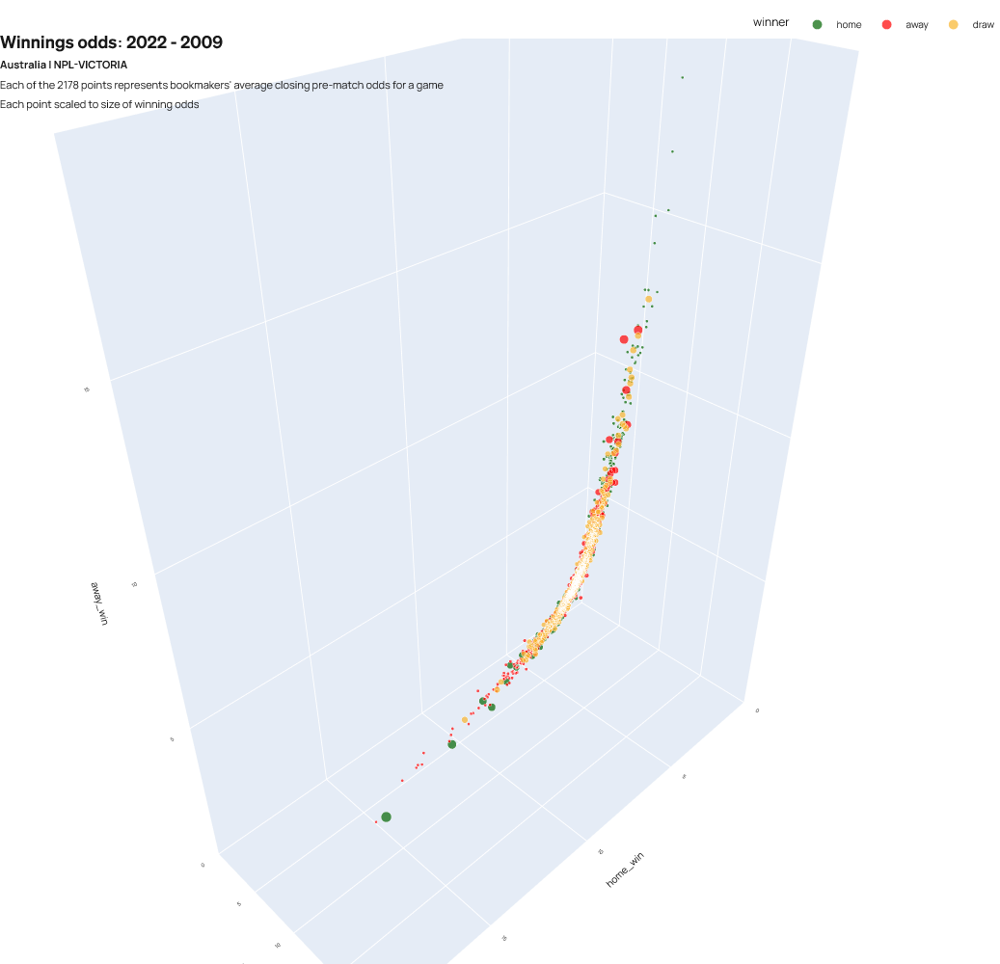

In [133]:
fig = make3DPlot(dfAV, 'subheadB')    